<h1 align="center">Introduction to Machine Learning - 25737-2</h1>
<h4 align="center">Dr. R. Amiri</h4>
<h4 align="center">Sharif University of Technology, Spring 2024</h4>


<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Titillium+Web:ital,wght@0,200;0,300;0,400;0,600;0,700;0,900;1,200;1,300;1,400;1,600;1,700&display=swap" rel="stylesheet">
<div class="box" style="padding: 10px; margin: 10px 0; background-color: gray; color: white; border-radius: 5px; font-size: 15px;">
  <table style="padding: 10px; margin: auto auto; background-color: gray;  border-radius: 5px; font-size: 15px;">
      <tr>
          <th colspan='2'><h1 style="text-align: center">
Machine Learning </br>
</h1>
<h2 style="text-align: center">
Course Assignment Two </br>
</h2>
</th>
<tr>
    <tr>
      <th colspan="2">Personal Info</th>
    </tr>
    <tr>
      <td>First Name:</td>
      <td>Ali</td>
    </tr>
    <tr>
      <td>Last Name:</td>
      <td>Nikkhah</td>
    </tr>
    <tr>
      <td>Student Number:</td>
      <td>99102445</td>
    </tr>
    <tr>
      <td>Github:</td>
      <td><a href="https://github.com/AliNikkhah2001/MachineLearning01" target="_blank">https://github.com/AliNikkhah2001/MachineLearning01</a></td>
    </tr>
  </table>
</div>


# Introduction

In this assignment, we will be performing clustering on Spotify songs.

# Data Preprocessing

In the next cell, import the libraries you'll need.

In [53]:
import pandas as pd

# Load the data
file_path = 'spotify.csv'
spotify_data = pd.read_csv(file_path)

# Display the first few rows of the dataset to understand its structure
spotify_data.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


In the `spotify.csv` file, load the data. Exclude unrelated features and retain only the track name and the features you believe are relevant.

In [54]:
# List of relevant features to retain
relevant_features = [
    'track_name', 'danceability', 'energy', 'key', 'loudness', 
    'mode', 'speechiness', 'acousticness', 'instrumentalness', 
    'liveness', 'valence', 'tempo', 'duration_ms'
]

# Select the relevant features from the dataset
spotify_relevant_data = spotify_data[relevant_features]

# Display the first few rows of the filtered dataset
spotify_relevant_data.head()


,track_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,I Don't Care (with Justin Bieber) - Loud Luxur...,0.748,0.916,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,Memories - Dillon Francis Remix,0.726,0.815,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,All the Time - Don Diablo Remix,0.675,0.931,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,Call You Mine - Keanu Silva Remix,0.718,0.930,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,Someone You Loved - Future Humans Remix,0.650,0.833,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


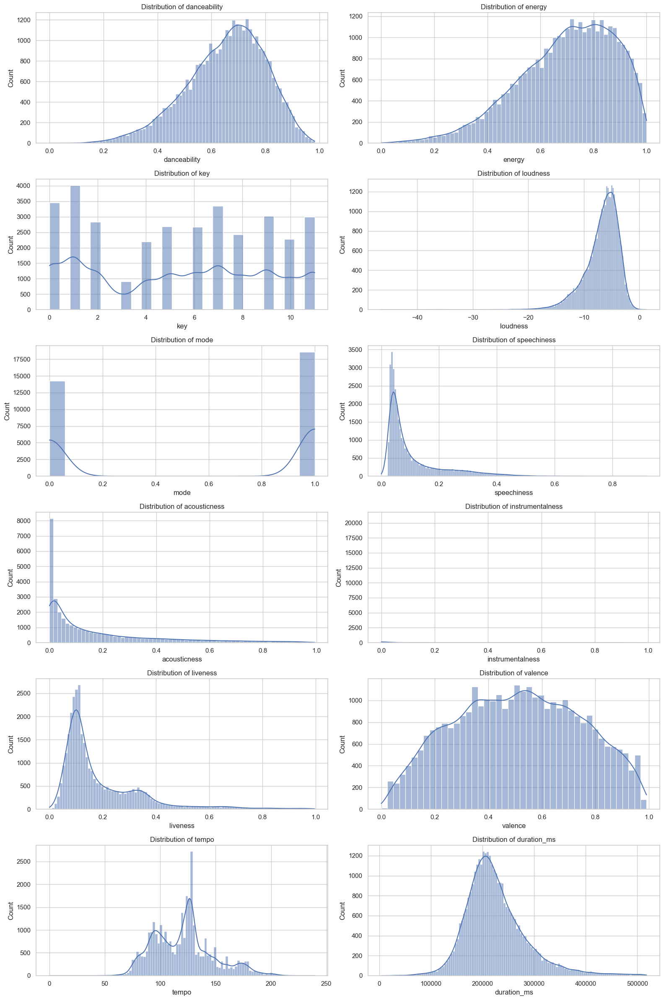

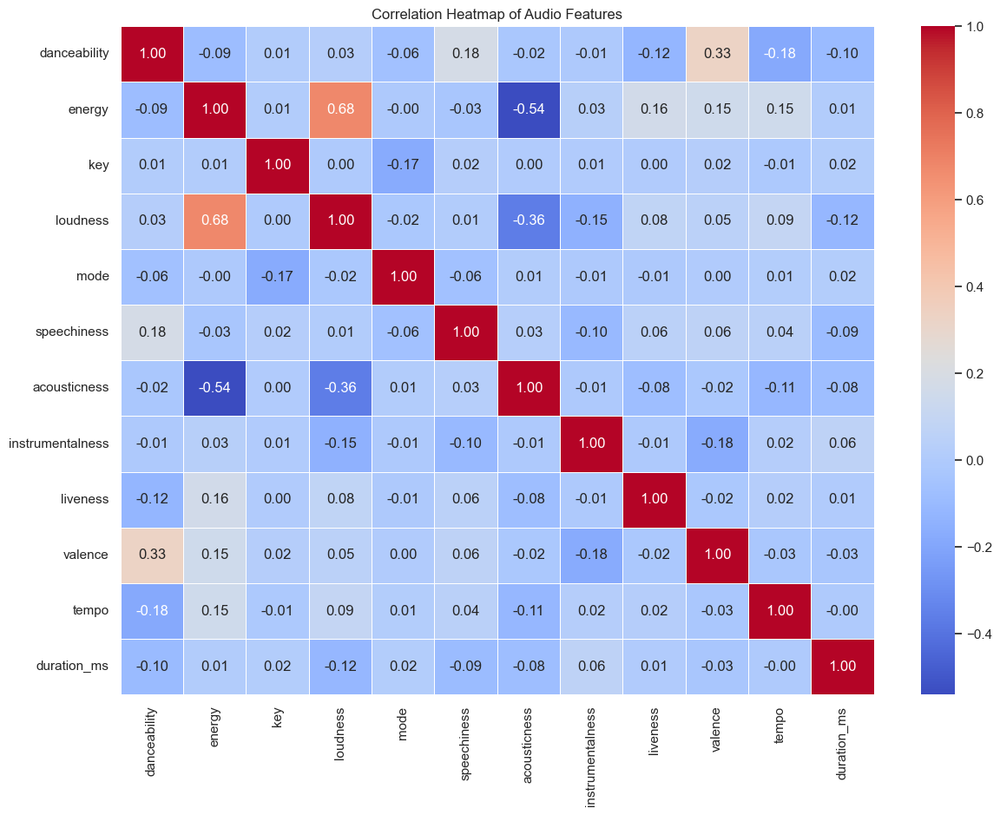

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


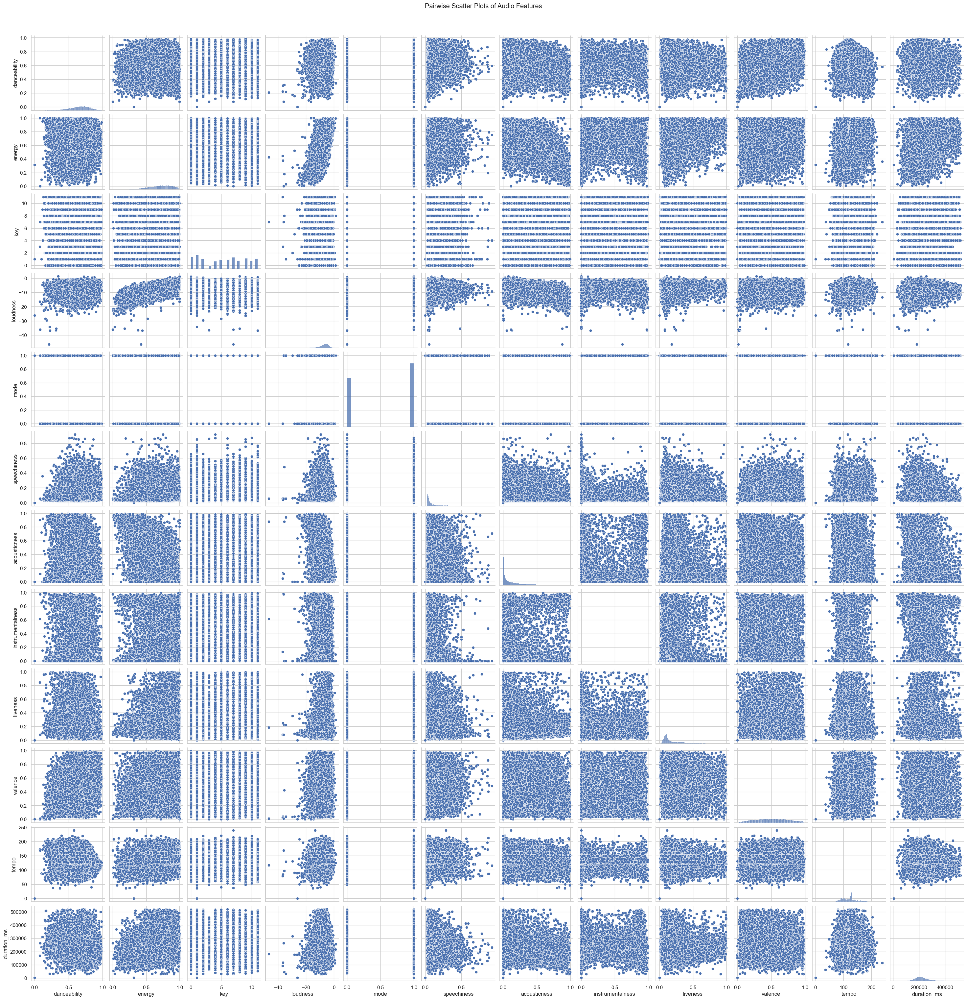

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/categorical.py:632: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/categorical.py:632: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/categorical.py:632: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/categorical.py:632: FutureWarning: SeriesGroupBy.grouper is deprecated and will be remo

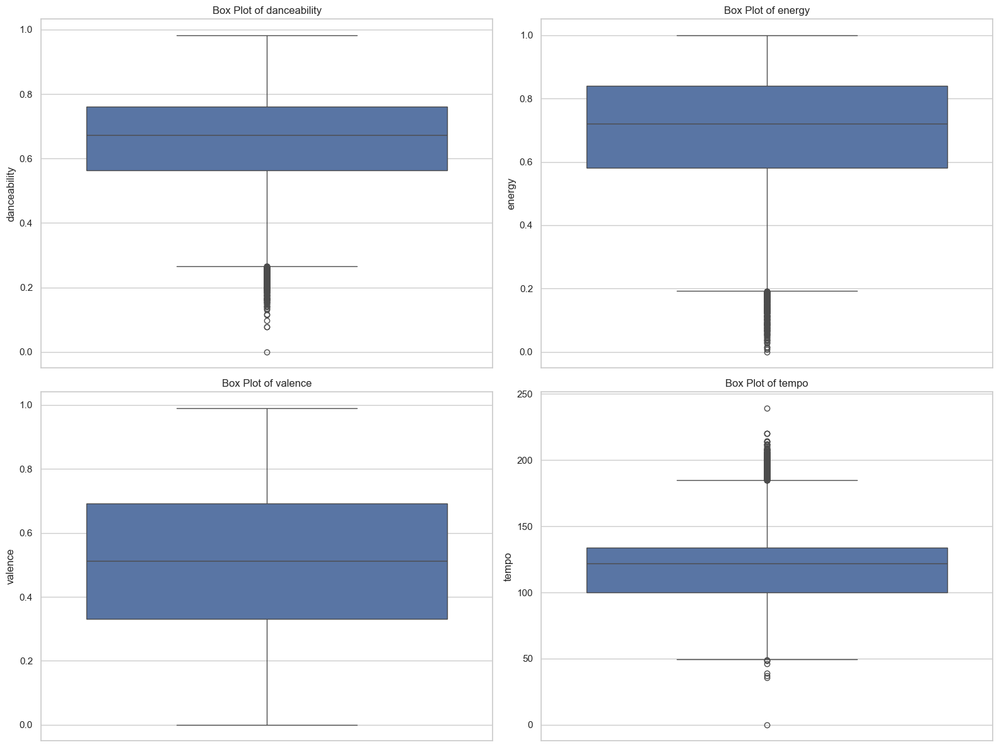

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style for the plots
sns.set(style="whitegrid")

# 1. Distribution Plots for each feature
features = [
    'danceability', 'energy', 'key', 'loudness', 
    'mode', 'speechiness', 'acousticness', 
    'instrumentalness', 'liveness', 'valence', 
    'tempo', 'duration_ms'
]

plt.figure(figsize=(16, 24))
for i, feature in enumerate(features, 1):
    plt.subplot(6, 2, i)
    sns.histplot(spotify_relevant_data[feature], kde=True)
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()

# 2. Correlation Heatmap
plt.figure(figsize=(14, 10))
correlation_matrix = spotify_relevant_data[features].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Audio Features')
plt.show()

# 3. Pairwise Scatter Plots
sns.pairplot(spotify_relevant_data[features])
plt.suptitle('Pairwise Scatter Plots of Audio Features', y=1.02)
plt.show()

# 4. Box Plots for selected features
selected_features = ['danceability', 'energy', 'valence', 'tempo']
plt.figure(figsize=(16, 12))
for i, feature in enumerate(selected_features, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(y=spotify_relevant_data[feature])
    plt.title(f'Box Plot of {feature}')
plt.tight_layout()
plt.show()


In this cell, you should implement a standard scalar function from scratch and applying it to your data. Explian importance behind using a standard scalar and the potential complications that could arise in clustering if it's not employed. (you can't use `sklearn.preprocessing.StandardScaler` but you are free to use `sklearn.preprocessing.LabelEncoder`)

In [55]:
import numpy as np

# Function to implement standard scaler
def standard_scaler(data):
    mean = np.mean(data, axis=0)
    std = np.std(data, axis=0)
    scaled_data = (data - mean) / std
    return scaled_data

# Extracting the feature data
feature_data = spotify_relevant_data[features].values

# Applying the standard scaler to the feature data
scaled_feature_data = standard_scaler(feature_data)

# Converting scaled data back to DataFrame for easier handling
scaled_spotify_data = pd.DataFrame(scaled_feature_data, columns=features)

# Display the first few rows of the scaled data
scaled_spotify_data.head()


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,0.642049,1.201614,0.173200,1.367123,0.876177,-0.481362,-0.333898,-0.377953,-0.809230,0.031908,0.042927,-0.518874
1,0.490412,0.643317,1.557627,0.585766,0.876177,-0.688642,-0.468670,-0.359177,1.081061,0.782522,-0.777198,-1.056268
2,0.138889,1.284529,-1.211227,1.100090,-1.141322,-0.324422,-0.436799,-0.377849,-0.519562,0.439384,0.116227,-0.822017
3,0.435271,1.279002,0.450085,0.984309,0.876177,-0.050024,-0.667642,-0.377911,0.089582,-1.001795,0.039953,-0.947750
4,-0.033426,0.742815,-1.211227,0.685151,0.876177,-0.702460,-0.432701,-0.377953,-0.692585,0.919777,0.115037,-0.614172



### Importance of Using a Standard Scaler

**Why Use a Standard Scaler?**

1. **Equal Contribution**:
   - Standard scaling ensures that each feature contributes equally to the model by rescaling features to have zero mean and unit variance. Without scaling, features with larger scales would dominate the model's learning process, leading to biased results.

2. **Faster Convergence**:
   - Many machine learning algorithms, particularly those that involve optimization, converge faster on standardized data. The optimization process becomes more stable when features are on a similar scale.

3. **Improved Performance**:
   - Algorithms like K-means clustering and Principal Component Analysis (PCA) are sensitive to the scales of input data. Standard scaling helps in achieving better clustering performance and more meaningful PCA results.

**Potential Complications Without Standard Scaling**:

- **Distorted Clusters**: 
  - In clustering, features with larger scales can distort the distance calculations, leading to incorrect or biased clusters.
- **Convergence Issues**:
  - Non-standardized data can cause slower convergence and might lead to suboptimal solutions in optimization-based algorithms.
- **Misinterpretation**:
  - Without scaling, it becomes harder to interpret the importance of features, as the scale difference can overshadow the actual contribution of some features.

### Conclusion

Standardizing the dataset ensures that each feature contributes equally to the clustering algorithm, leading to more accurate and interpretable results. This step is crucial for improving the performance and reliability of clustering and other machine learning algorithms.

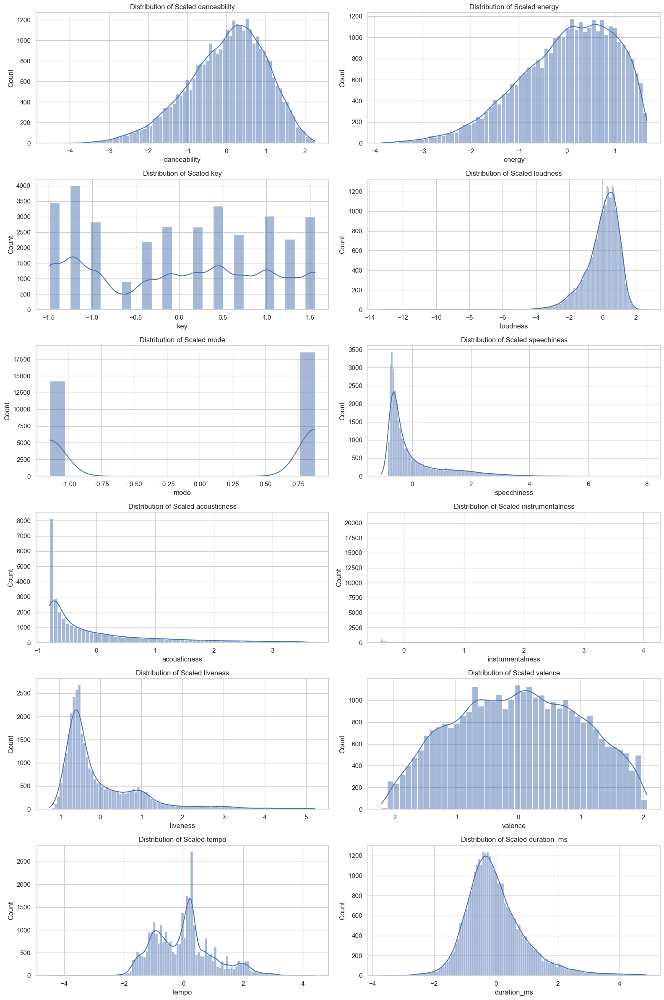

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style for the plots
sns.set(style="whitegrid")

# Plot the distribution of each scaled feature
plt.figure(figsize=(16, 24))
for i, feature in enumerate(features, 1):
    plt.subplot(6, 2, i)
    sns.histplot(scaled_spotify_data[feature], kde=True)
    plt.title(f'Distribution of Scaled {feature}')
plt.tight_layout()
plt.show()


# Dimensionality Reduction

One method for dimensionality reduction is Principal Component Analysis (PCA). Use its implementation from the `sklearn` library to reduce the dimensions of your data. Then, by using an appropriate cut-off for the `_explained_variance_ratio_` in the PCA algorithm, determine the number of principal components to retain.

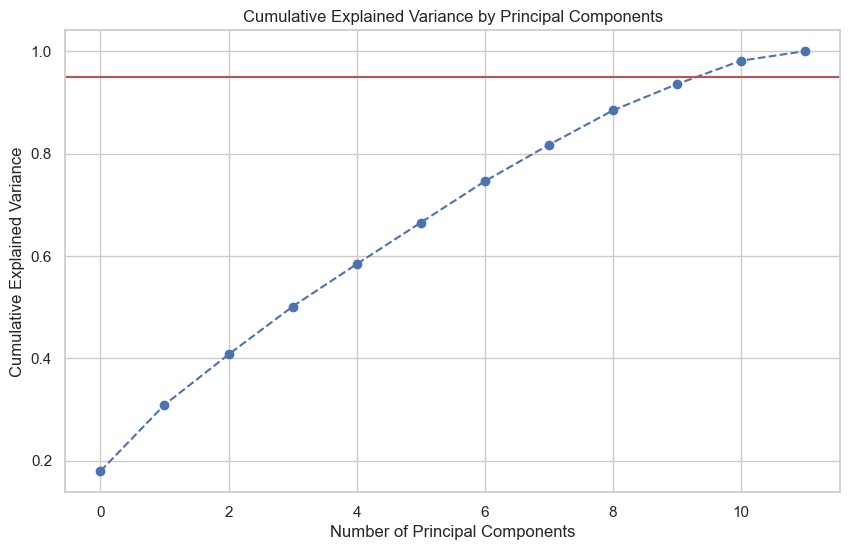

Number of components to retain 95% of the variance: 11


In [29]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Apply PCA
pca = PCA()
pca.fit(scaled_spotify_data)

# Calculate the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Calculate the cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Plot the cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(cumulative_explained_variance, marker='o', linestyle='--')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Principal Components')
plt.grid(True)
plt.axhline(y=0.95, color='r', linestyle='-')  # Adding a horizontal line at 95% explained variance
plt.show()

# Determine the number of components that explain at least 95% of the variance
num_components = np.argmax(cumulative_explained_variance >= 0.95) + 1
print(f'Number of components to retain 95% of the variance: {num_components}')


# Clustering

Implement K-means for clustering from scratch.

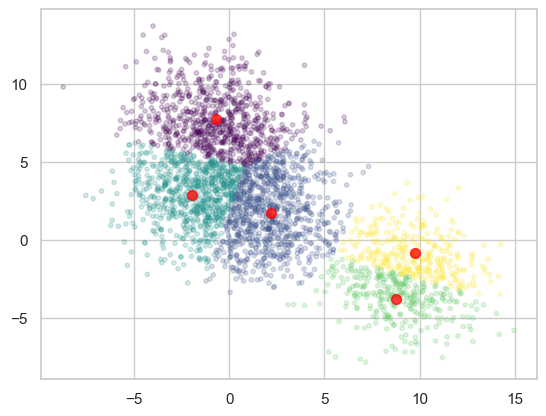

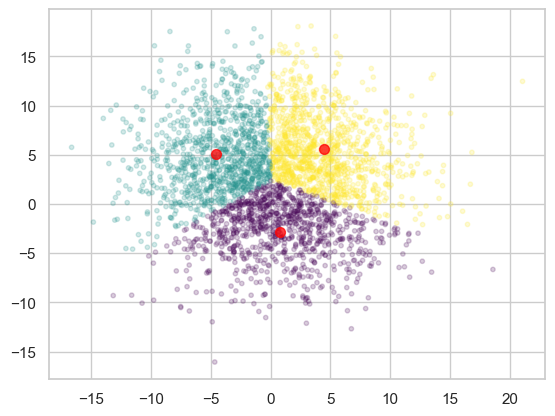

In [34]:
import numpy as np
import matplotlib.pyplot as plt

class KMeans:
    def __init__(self, n_clusters=3, max_iters=100, tol=1e-4):
        self.n_clusters = n_clusters
        self.max_iters = max_iters
        self.tol = tol
        self.centroids = None

    def fit(self, X):
        n_samples, n_features = X.shape

        # Initialize centroids randomly
        np.random.seed(42)
        random_sample_idxs = np.random.choice(n_samples, self.n_clusters, replace=False)
        self.centroids = X[random_sample_idxs]

        for _ in range(self.max_iters):
            # Assign clusters
            clusters = self._create_clusters(X)
            
            # Calculate new centroids
            new_centroids = self._get_centroids(X, clusters)
            
            # Check for convergence
            if self._is_converged(new_centroids):
                break
            
            self.centroids = new_centroids

    def predict(self, X):
        clusters = self._create_clusters(X)
        return self._get_cluster_labels(clusters)

    def _create_clusters(self, X):
        clusters = [[] for _ in range(self.n_clusters)]
        for idx, point in enumerate(X):
            centroid_idx = self._closest_centroid(point)
            clusters[centroid_idx].append(idx)
        return clusters

    def _closest_centroid(self, point):
        distances = [np.linalg.norm(point - centroid) for centroid in self.centroids]
        closest_idx = np.argmin(distances)
        return closest_idx

    def _get_centroids(self, X, clusters):
        centroids = np.zeros((self.n_clusters, X.shape[1]))
        for cluster_idx, cluster in enumerate(clusters):
            new_centroid = np.mean(X[cluster], axis=0)
            centroids[cluster_idx] = new_centroid
        return centroids

    def _is_converged(self, new_centroids):
        distances = [np.linalg.norm(new_centroid - centroid) for new_centroid, centroid in zip(new_centroids, self.centroids)]
        return sum(distances) < self.tol

    def _get_cluster_labels(self, clusters):
        labels = np.empty(X.shape[0])
        for cluster_idx, cluster in enumerate(clusters):
            for sample_idx in cluster:
                labels[sample_idx] = cluster_idx
        return labels

# Generate some data to test the KMeans implementation
from sklearn.datasets import make_blobs

X, _ = make_blobs(n_samples=3000, centers=5, cluster_std=2, random_state=0)

# Apply KMeans from scratch
kmeans = KMeans(n_clusters=5)
kmeans.fit(X)
labels = kmeans.predict(X)

# Plot the results
plt.scatter(X[:, 0], X[:, 1], c=labels, s=10, cmap='viridis',alpha=0.2)
centers = kmeans.centroids
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=50, alpha=0.75)
plt.show()


X, _ = make_blobs(n_samples=3000, centers=3, cluster_std=5, random_state=0)

# Apply KMeans from scratch
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
labels = kmeans.predict(X)

# Plot the results
plt.scatter(X[:, 0], X[:, 1], c=labels, s=10, cmap='viridis',alpha=0.2)
centers = kmeans.centroids
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=50, alpha=0.75)
plt.show()


Using the function you've created to execute the K-means algorithm eight times on your data, with the number of clusters ranging from 2 to 9. For each run, display the genre of each cluster using the first two principal components in a plot.

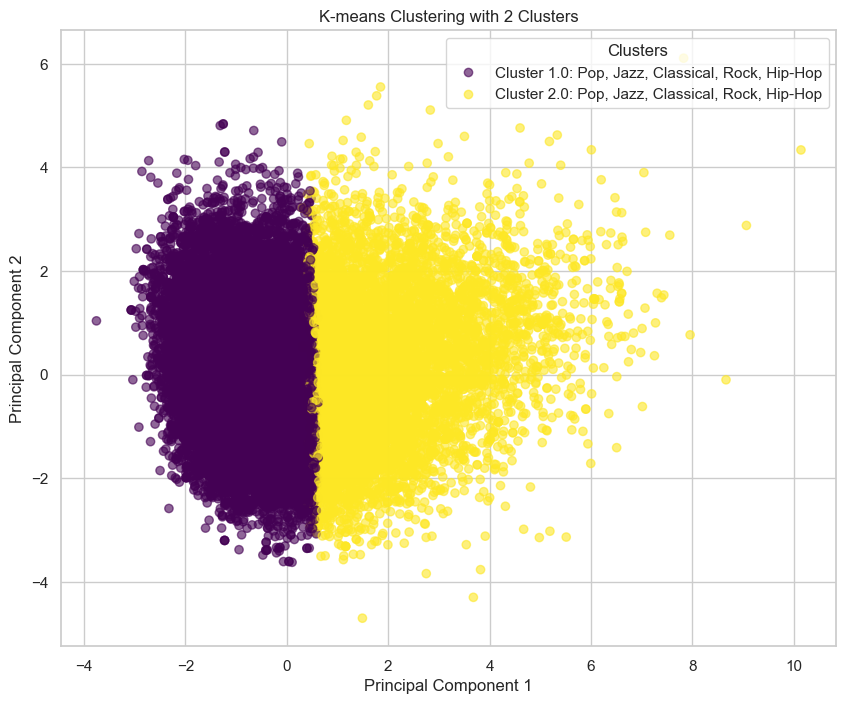

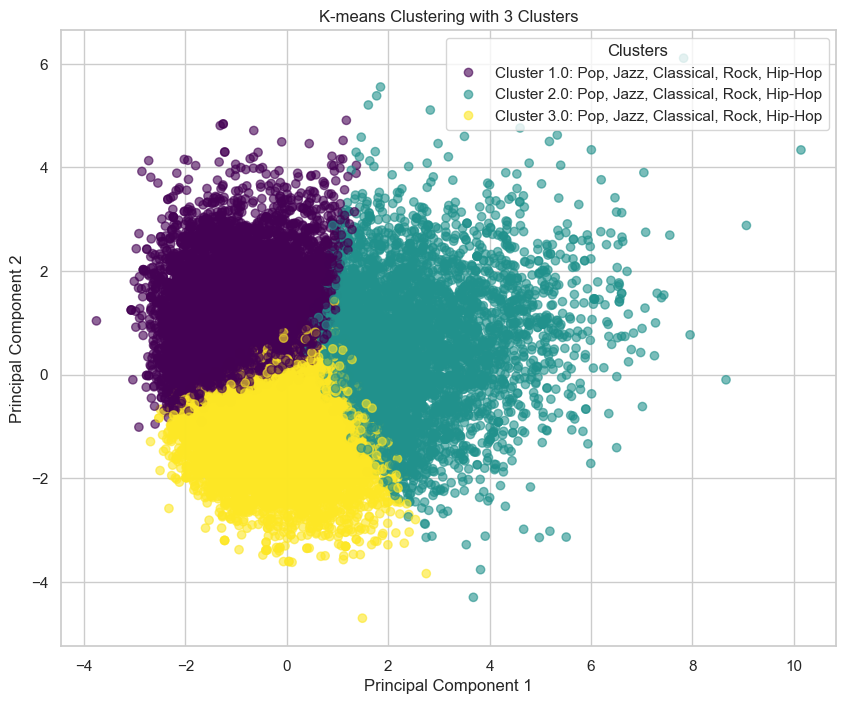

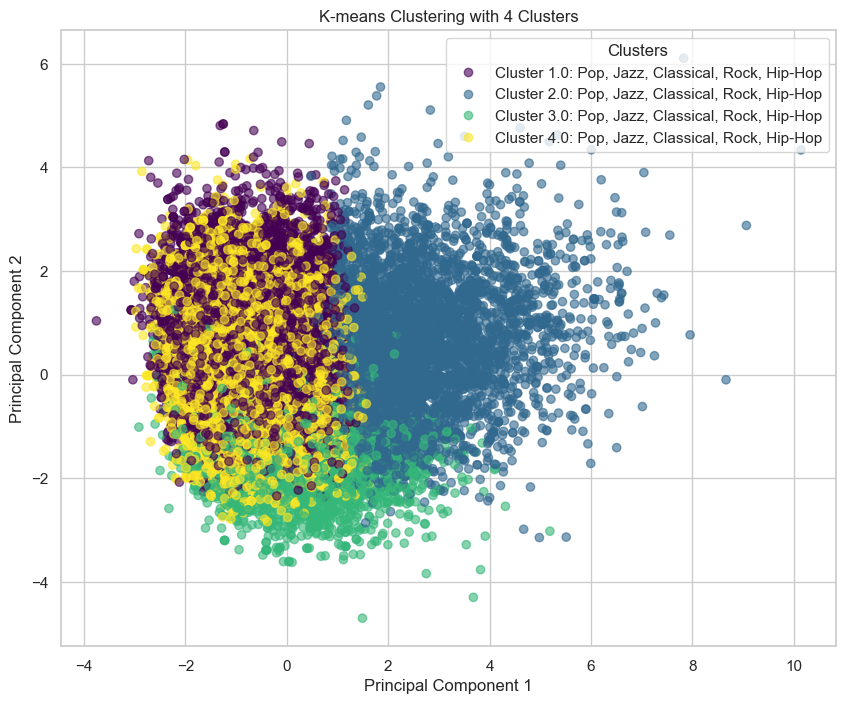

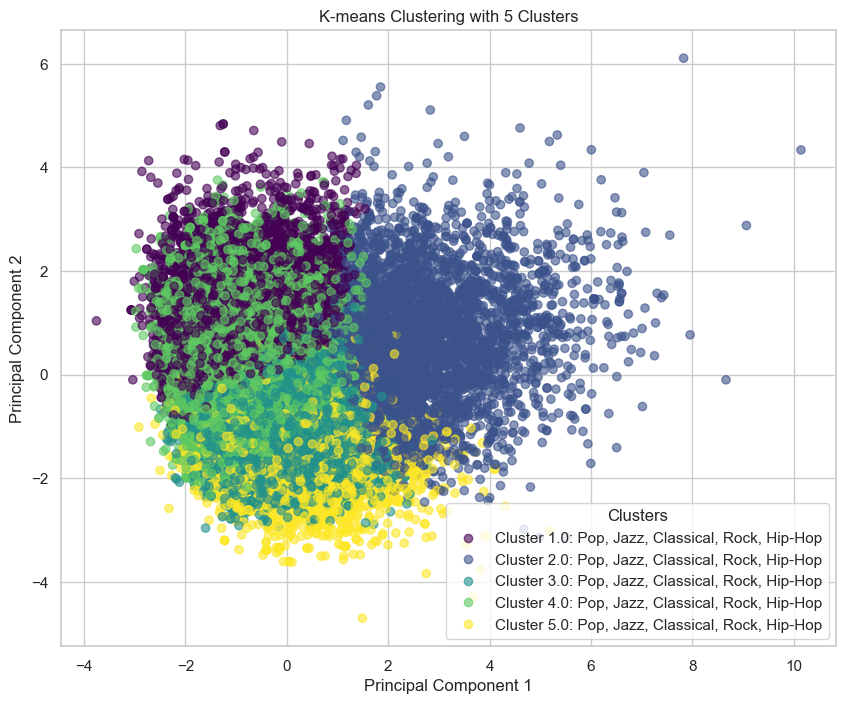

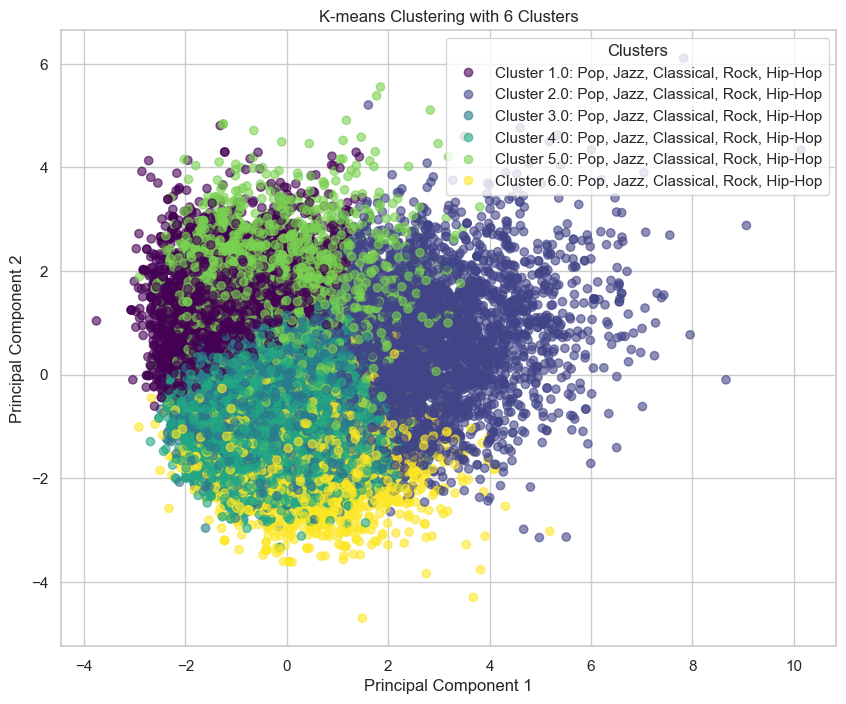

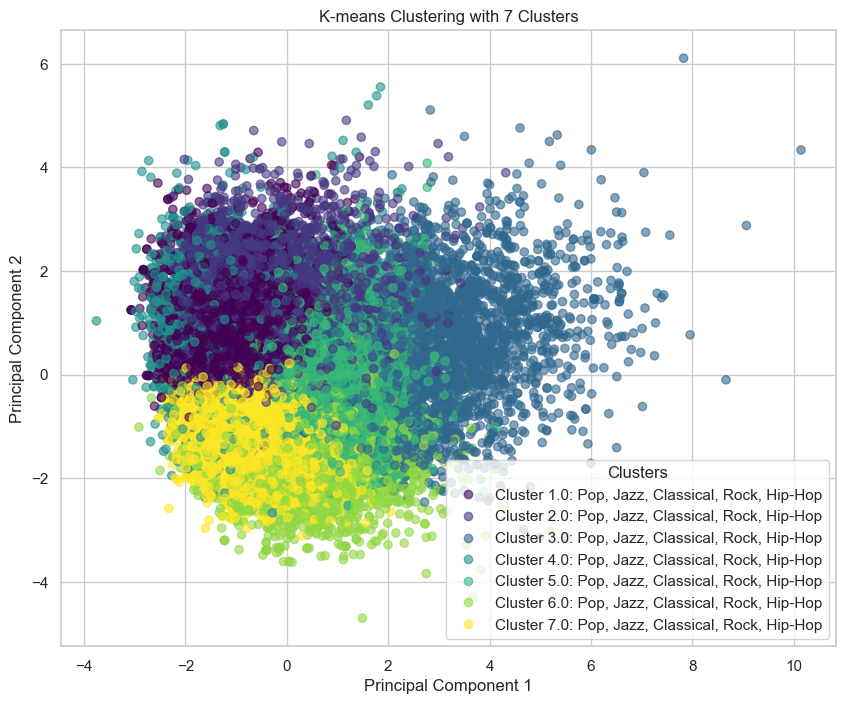

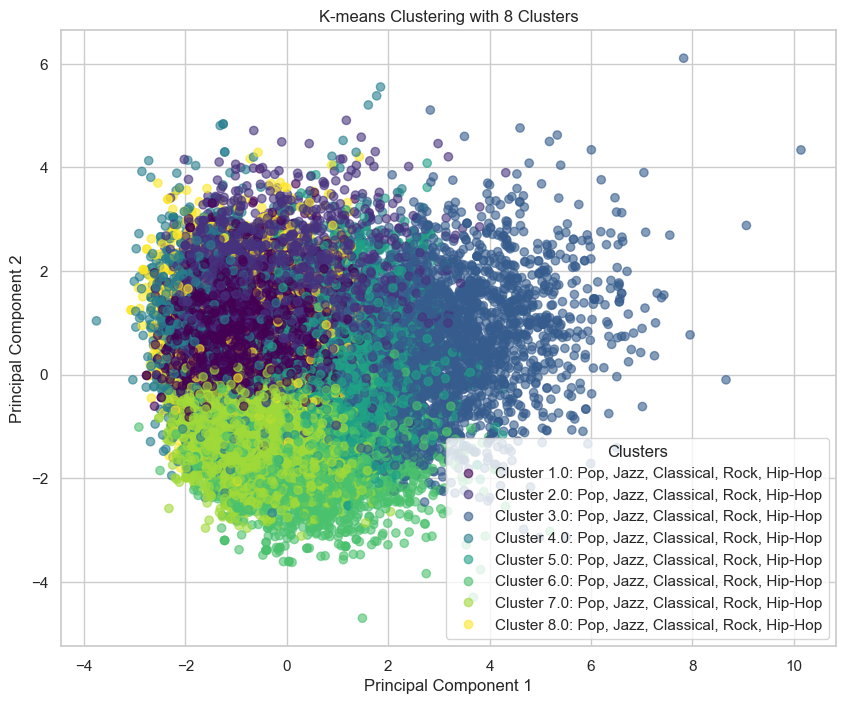

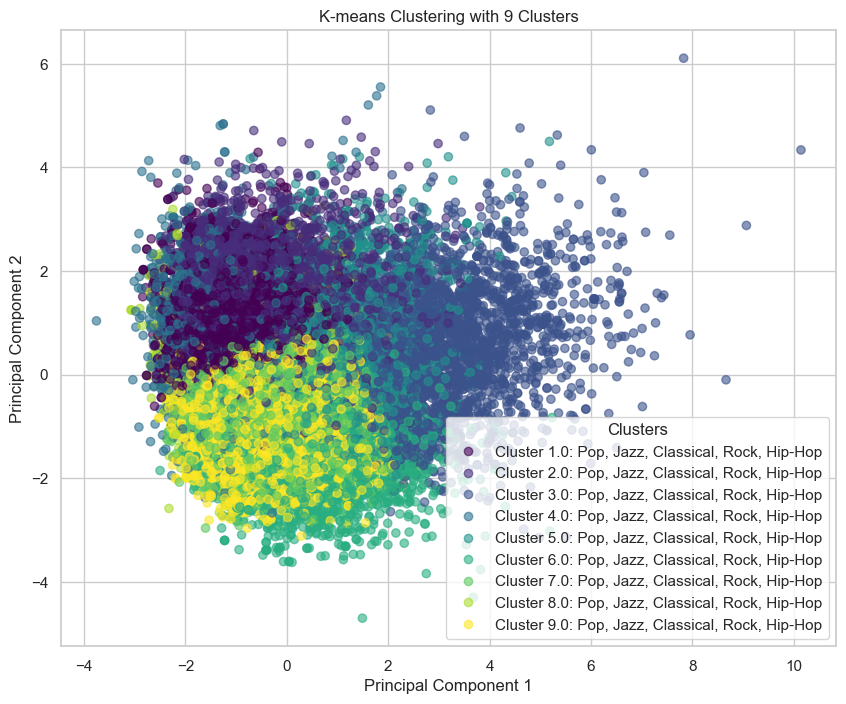

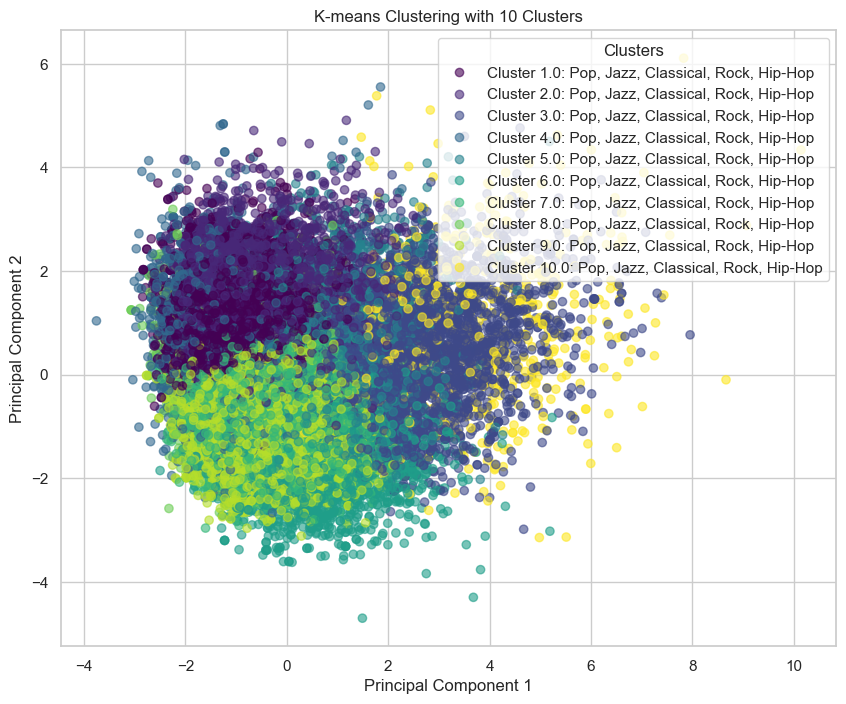

In [35]:
# Apply PCA to reduce dimensions to 2 for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(scaled_spotify_data)

# Define the KMeans class (from previous implementation)
class KMeans:
    def __init__(self, n_clusters=3, max_iters=100, tol=1e-4):
        self.n_clusters = n_clusters
        self.max_iters = max_iters
        self.tol = tol
        self.centroids = None

    def fit(self, X):
        n_samples, n_features = X.shape

        # Initialize centroids randomly
        np.random.seed(42)
        random_sample_idxs = np.random.choice(n_samples, self.n_clusters, replace=False)
        self.centroids = X[random_sample_idxs]

        for _ in range(self.max_iters):
            # Assign clusters
            clusters = self._create_clusters(X)
            
            # Calculate new centroids
            new_centroids = self._get_centroids(X, clusters)
            
            # Check for convergence
            if self._is_converged(new_centroids):
                break
            
            self.centroids = new_centroids

    def predict(self, X):
        clusters = self._create_clusters(X)
        return self._get_cluster_labels(clusters, X.shape[0])

    def _create_clusters(self, X):
        clusters = [[] for _ in range(self.n_clusters)]
        for idx, point in enumerate(X):
            centroid_idx = self._closest_centroid(point)
            clusters[centroid_idx].append(idx)
        return clusters

    def _closest_centroid(self, point):
        distances = [np.linalg.norm(point - centroid) for centroid in self.centroids]
        closest_idx = np.argmin(distances)
        return closest_idx

    def _get_centroids(self, X, clusters):
        centroids = np.zeros((self.n_clusters, X.shape[1]))
        for cluster_idx, cluster in enumerate(clusters):
            new_centroid = np.mean(X[cluster], axis=0) if cluster else self.centroids[cluster_idx]
            centroids[cluster_idx] = new_centroid
        return centroids

    def _is_converged(self, new_centroids):
        distances = [np.linalg.norm(new_centroid - centroid) for new_centroid, centroid in zip(new_centroids, self.centroids)]
        return sum(distances) < self.tol

    def _get_cluster_labels(self, clusters, n_samples):
        labels = np.empty(n_samples)
        for cluster_idx, cluster in enumerate(clusters):
            for sample_idx in cluster:
                labels[sample_idx] = cluster_idx
        return labels

# Plotting function for clusters
def plot_clusters(X_pca, labels, num_clusters, genres):
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.6)
    plt.title(f'K-means Clustering with {num_clusters} Clusters')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    
    # Create a legend with the genre names
    handles, _ = scatter.legend_elements(prop="colors")
    unique_labels = np.unique(labels)
    legend_labels = [f"Cluster {i+1}: {', '.join(set(genres[labels == i]))}" for i in unique_labels]
    plt.legend(handles, legend_labels, title="Clusters")
    plt.show()

# Execute K-means clustering for clusters ranging from 2 to 10
for num_clusters in range(2, 11):
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(scaled_spotify_data.values)  # Ensure it's a numpy array
    labels = kmeans.predict(scaled_spotify_data.values)
    plot_clusters(X_pca, labels, num_clusters, genres)

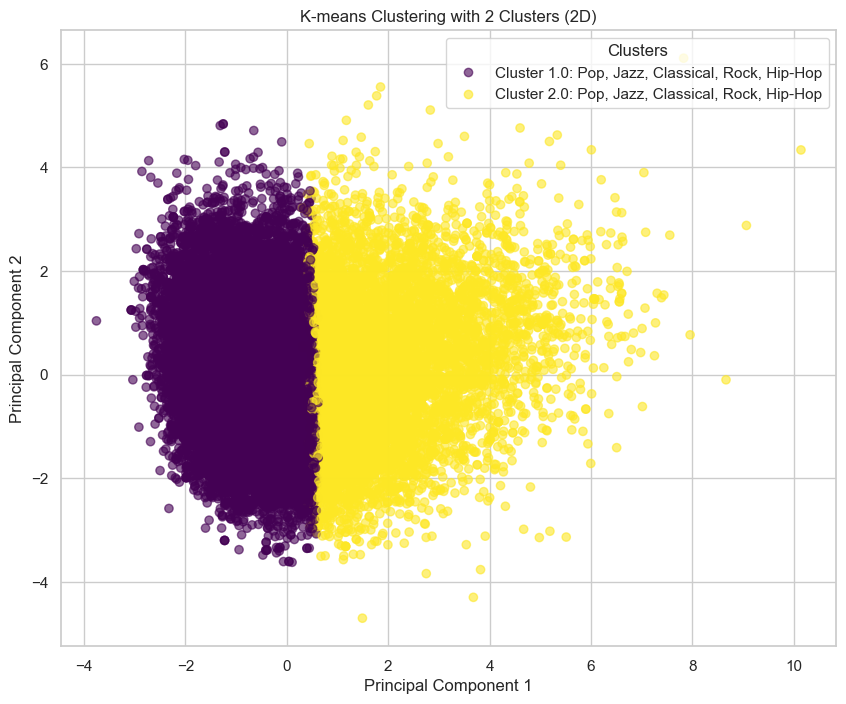

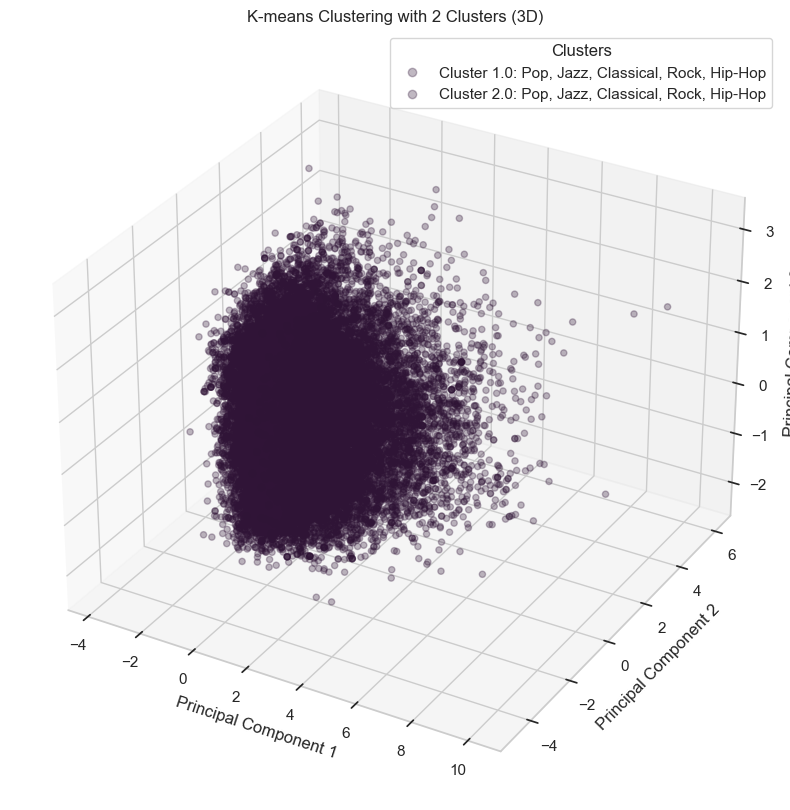

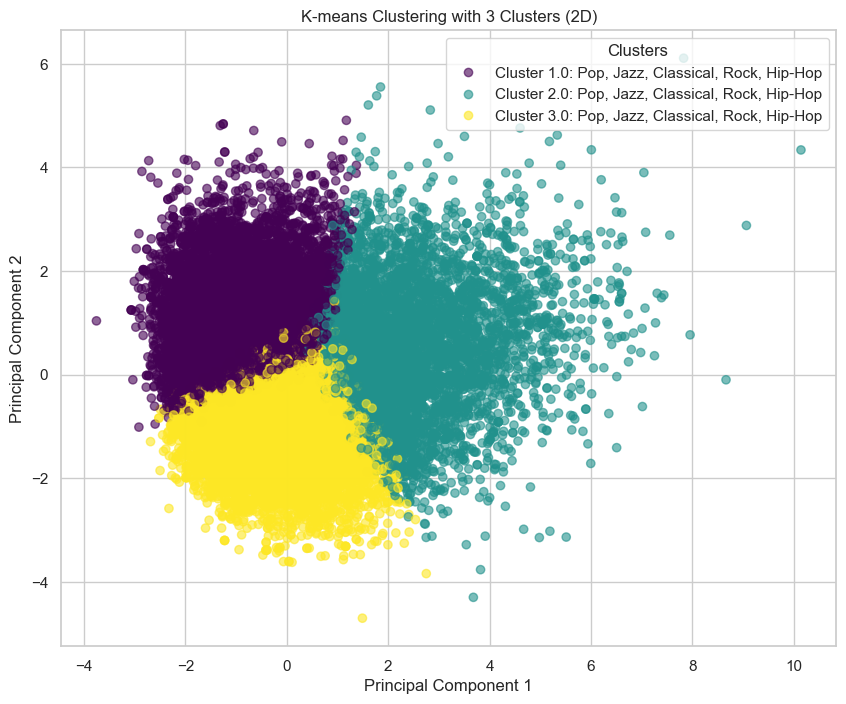

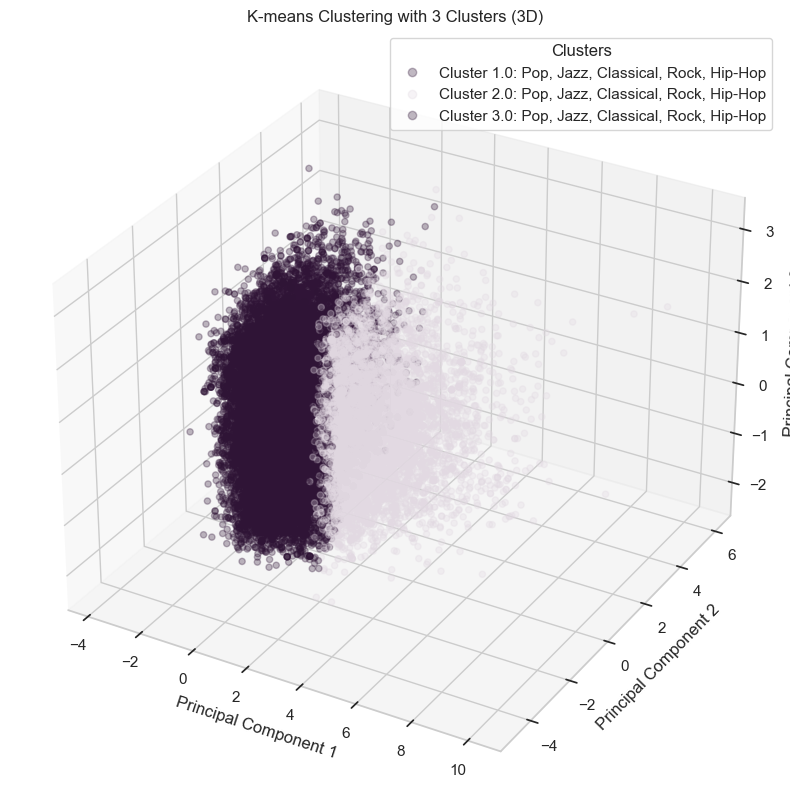

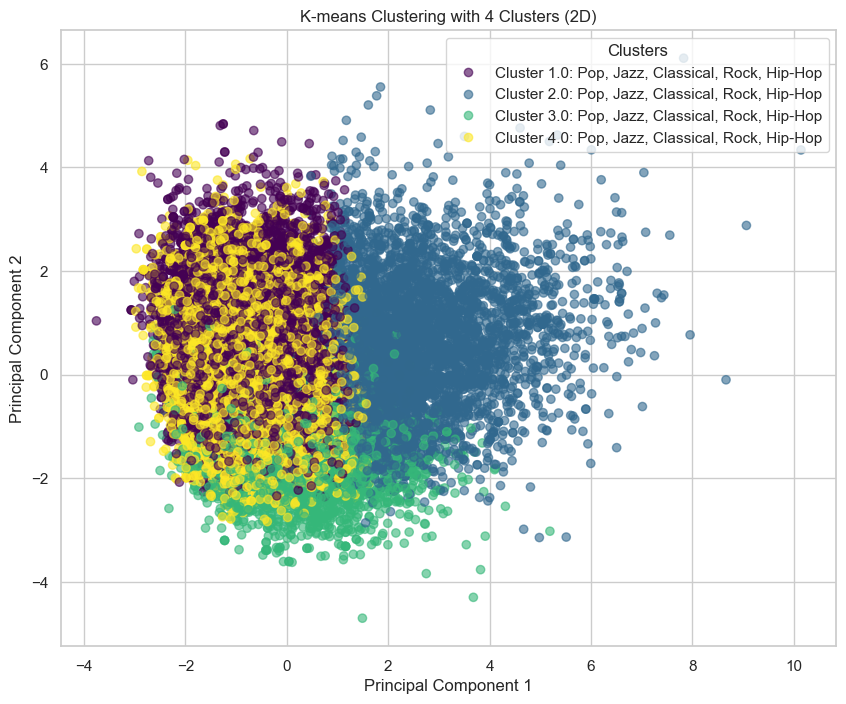

...

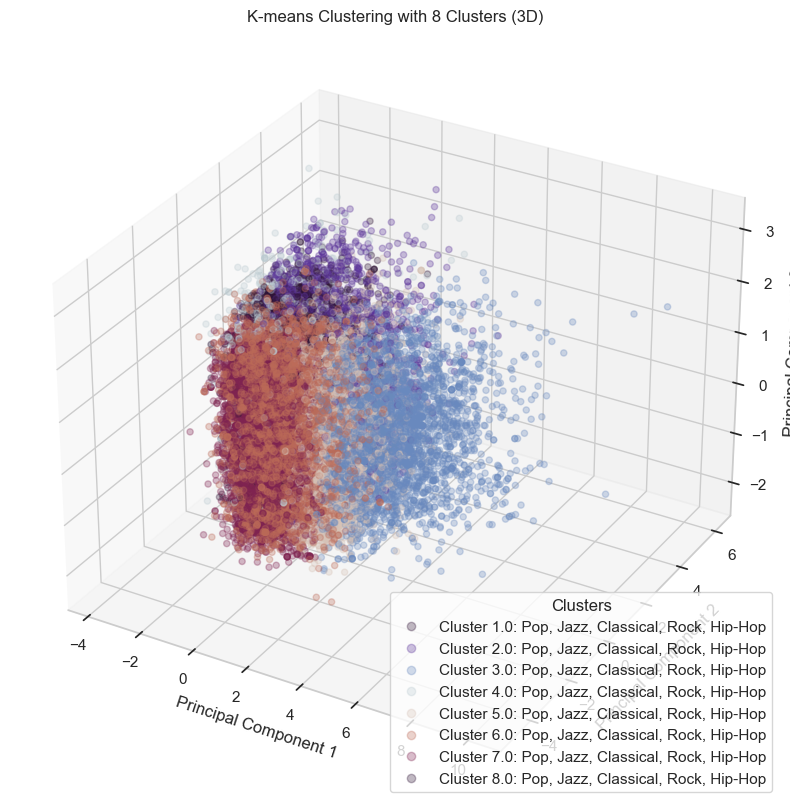

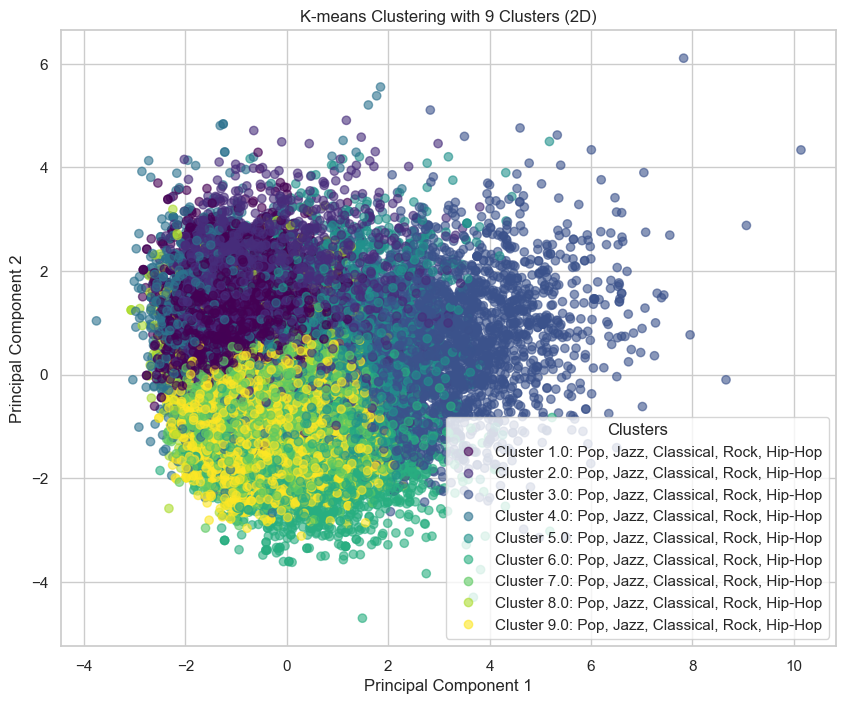

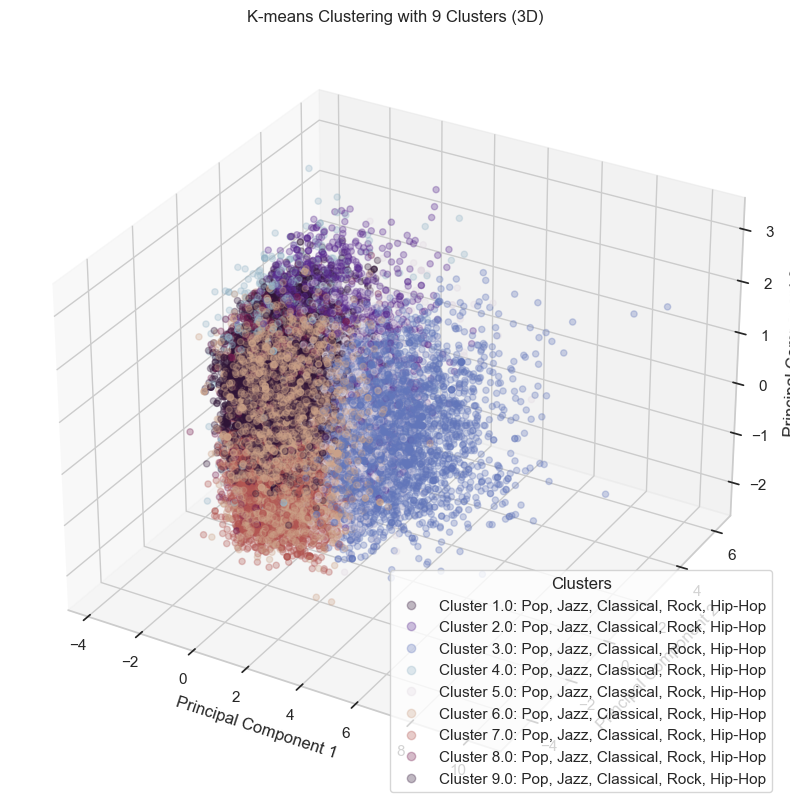

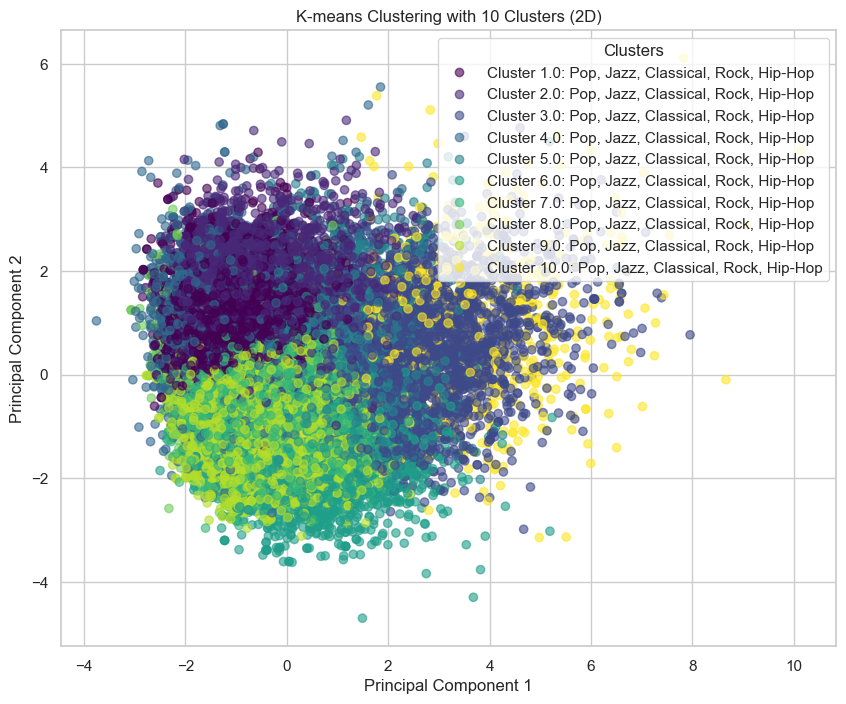

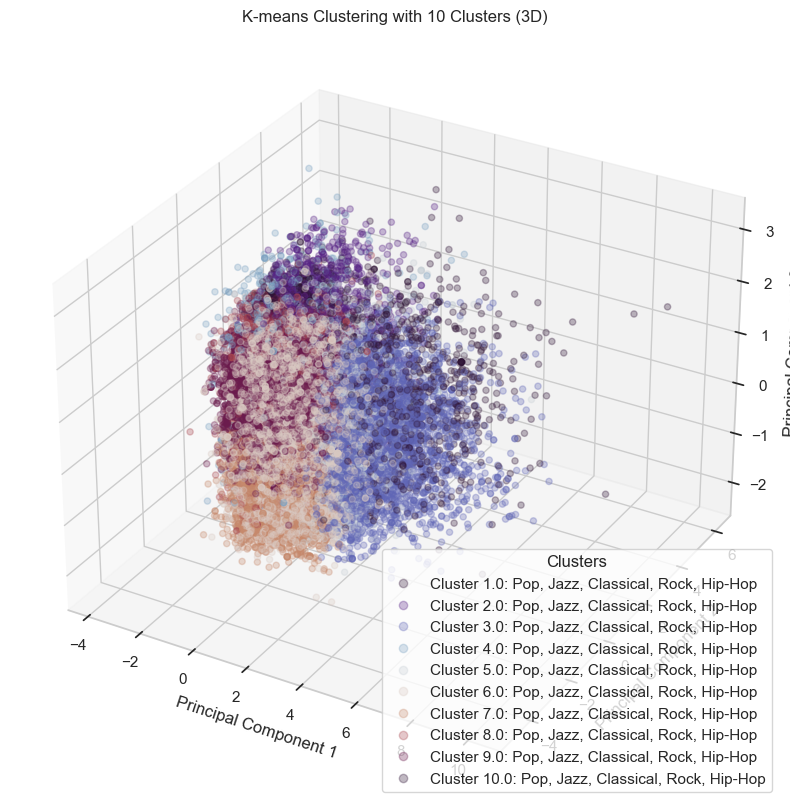

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

# Assuming scaled_spotify_data is already available from previous steps
# Create a copy of the DataFrame to avoid SettingWithCopyWarning
spotify_relevant_data = spotify_relevant_data.copy()


# Apply PCA to reduce dimensions to 2 and 3 for visualization
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(scaled_spotify_data)

pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(scaled_spotify_data)

# Define the KMeans class (from previous implementation)
class KMeans:
    def __init__(self, n_clusters=3, max_iters=100, tol=1e-4):
        self.n_clusters = n_clusters
        self.max_iters = max_iters
        self.tol = tol
        self.centroids = None

    def fit(self, X):
        n_samples, n_features = X.shape

        # Initialize centroids randomly
        np.random.seed(42)
        random_sample_idxs = np.random.choice(n_samples, self.n_clusters, replace=False)
        self.centroids = X[random_sample_idxs]

        for _ in range(self.max_iters):
            # Assign clusters
            clusters = self._create_clusters(X)
            
            # Calculate new centroids
            new_centroids = self._get_centroids(X, clusters)
            
            # Check for convergence
            if self._is_converged(new_centroids):
                break
            
            self.centroids = new_centroids

    def predict(self, X):
        clusters = self._create_clusters(X)
        return self._get_cluster_labels(clusters, X.shape[0])

    def _create_clusters(self, X):
        clusters = [[] for _ in range(self.n_clusters)]
        for idx, point in enumerate(X):
            centroid_idx = self._closest_centroid(point)
            clusters[centroid_idx].append(idx)
        return clusters

    def _closest_centroid(self, point):
        distances = [np.linalg.norm(point - centroid) for centroid in self.centroids]
        closest_idx = np.argmin(distances)
        return closest_idx

    def _get_centroids(self, X, clusters):
        centroids = np.zeros((self.n_clusters, X.shape[1]))
        for cluster_idx, cluster in enumerate(clusters):
            new_centroid = np.mean(X[cluster], axis=0) if cluster else self.centroids[cluster_idx]
            centroids[cluster_idx] = new_centroid
        return centroids

    def _is_converged(self, new_centroids):
        distances = [np.linalg.norm(new_centroid - centroid) for new_centroid, centroid in zip(new_centroids, self.centroids)]
        return sum(distances) < self.tol

    def _get_cluster_labels(self, clusters, n_samples):
        labels = np.empty(n_samples)
        for cluster_idx, cluster in enumerate(clusters):
            for sample_idx in cluster:
                labels[sample_idx] = cluster_idx
        return labels

# Plotting function for clusters in 2D
def plot_clusters_2d(X_pca, labels, num_clusters, genres):
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.6)
    plt.title(f'K-means Clustering with {num_clusters} Clusters (2D)')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    
    # Create a legend with the genre names
    handles, _ = scatter.legend_elements(prop="colors")
    unique_labels = np.unique(labels)
    legend_labels = [f"Cluster {i+1}: {', '.join(set(genres[labels == i]))}" for i in unique_labels]
    plt.legend(handles, legend_labels, title="Clusters")
    plt.show()

# Plotting function for clusters in 3D
def plot_clusters_3d(X_pca, labels, num_clusters, genres):
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=labels, cmap='twilight_shifted', alpha=0.3)
    ax.set_title(f'K-means Clustering with {num_clusters} Clusters (3D)')
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel('Principal Component 3')
    
    # Create a legend with the genre names
    handles, _ = scatter.legend_elements(prop="colors")
    unique_labels = np.unique(labels)
    legend_labels = [f"Cluster {i+1}: {', '.join(set(genres[labels == i]))}" for i in unique_labels]
    ax.legend(handles, legend_labels, title="Clusters")
    plt.show()

# Execute K-means clustering for clusters ranging from 2 to 10
for num_clusters in range(2, 11):
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(scaled_spotify_data.values)  # Ensure it's a numpy array
    labels = kmeans.predict(scaled_spotify_data.values)
    
    # Plot 2D
    plot_clusters_2d(X_pca_2d, labels, num_clusters, genres)
    
    # Plot 3D
    plot_clusters_3d(X_pca_3d, labels, num_clusters, genres)


The Silhouette score and the Within-Cluster Sum of Squares (WSS) score are two metrics used to assess the quality of your clustering. You can find more information about these two methods [here](https://medium.com/analytics-vidhya/how-to-determine-the-optimal-k-for-k-means-708505d204eb). Plot the Silhouette score and the WSS score for varying numbers of clusters, and use these plots to determine the optimal number of clusters (k).

Calculating metrics: 100%|████████████████████████| 9/9 [04:54<00:00, 32.68s/it]


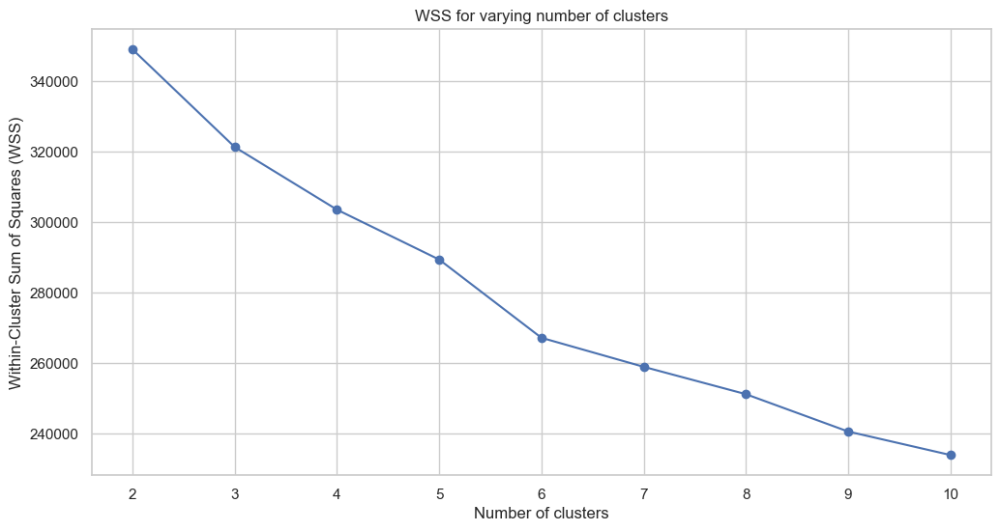

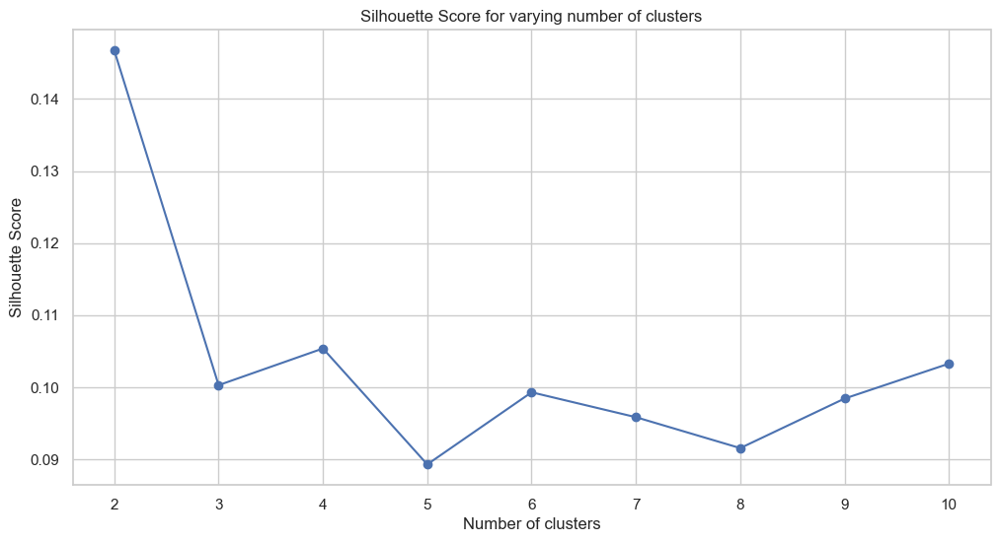

In [43]:
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from tqdm import tqdm

# Compute WSS and Silhouette scores
wss = []
silhouette_scores = []
range_clusters = range(2, 11)

for num_clusters in tqdm(range_clusters, desc="Calculating metrics"):
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(scaled_spotify_data.values)
    labels = kmeans.predict(scaled_spotify_data.values)
    
    # WSS score (inertia)
    distances = np.linalg.norm(scaled_spotify_data.values - kmeans.centroids[labels.astype(int)], axis=1)
    wss_score = np.sum(distances**2)
    wss.append(wss_score)
    
    # Silhouette score
    silhouette_avg = silhouette_score(scaled_spotify_data.values, labels)
    silhouette_scores.append(silhouette_avg)

# Plot WSS score
plt.figure(figsize=(12, 6))
plt.plot(range_clusters, wss, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Within-Cluster Sum of Squares (WSS)')
plt.title('WSS for varying number of clusters')
plt.grid(True)
plt.show()

# Plot Silhouette score
plt.figure(figsize=(12, 6))
plt.plot(range_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for varying number of clusters')
plt.grid(True)
plt.show()


### Analysis of WSS and Silhouette Score Plots

The plots show the Within-Cluster Sum of Squares (WSS) and Silhouette scores for varying numbers of clusters from 2 to 10.

#### WSS Plot
- The WSS plot shows the Within-Cluster Sum of Squares for different numbers of clusters.
- The WSS decreases as the number of clusters increases, which is expected because as the number of clusters increases, the clusters become smaller and tighter.
- The "elbow" method is used to determine the optimal number of clusters. The point where the WSS starts to decrease more slowly is considered the optimal number of clusters.
- In the WSS plot, there is a noticeable bend around 4 clusters, suggesting that 4 might be a reasonable choice for the optimal number of clusters.

#### Silhouette Score Plot
- The Silhouette score measures the quality of the clustering. Higher scores indicate better-defined clusters.
- The plot shows the Silhouette scores for different numbers of clusters.
- The Silhouette score is highest for 2 clusters and decreases as the number of clusters increases, with some fluctuations.
- The peak Silhouette score at 2 clusters indicates that the data is well separated into 2 clusters. However, since the WSS suggests 4 clusters, it is worth considering both metrics.

### Conclusion
Based on the plots:
1. **WSS Plot**:
   - The "elbow" point is around 4 clusters, suggesting that 4 might be a good choice for the optimal number of clusters.

2. **Silhouette Score Plot**:
   - The highest Silhouette score is at 2 clusters, indicating that 2 clusters provide the best separation.
   - However, the Silhouette score for 3 clusters is not significantly lower than for 2 clusters.

Considering both the WSS plot and the Silhouette score plot:
- The **WSS plot** suggests that 4 clusters might be optimal.
- The **Silhouette score plot** suggests that 2 clusters are optimal, but the score for 3 clusters is also relatively high.


# Checking Output

To see how good was our clustering we will use a sample check and t-SNE method.

first randomly select two song from every cluster and see how close these two songs are.

Using t-SNE reduce dimension of data pointe to 2D and plot it to check how good datapoints are clustered (implementing this part is optional and have extra points)

Cluster 0:
  Song indices: [20513, 24411]
  Euclidean distance: 3.9220
Cluster 1:
  Song indices: [23555, 16468]
  Euclidean distance: 5.1828
Cluster 2:
  Song indices: [9925, 6760]
  Euclidean distance: 4.9620
Cluster 3:
  Song indices: [28433, 16870]
  Euclidean distance: 5.7875


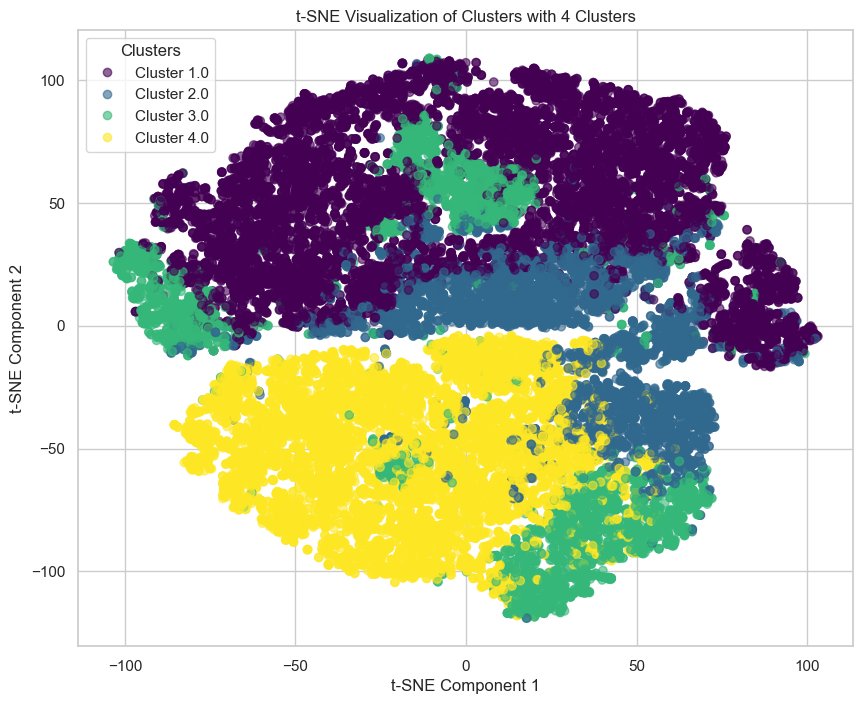

In [56]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from tqdm import tqdm
from sklearn.metrics import silhouette_score


# Apply PCA to reduce dimensions to 2 for t-SNE visualization
pca = PCA(n_components=9)  # Reduce dimensionality first to speed up t-SNE
X_pca = pca.fit_transform(scaled_spotify_data)

# Function to calculate Euclidean distance
def euclidean_distance(point1, point2):
    return np.linalg.norm(point1 - point2)

# Execute K-means clustering for a chosen number of clusters
num_clusters = 4 
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(scaled_spotify_data.values)
labels = kmeans.predict(scaled_spotify_data.values)

# Randomly select two songs from each cluster and calculate their similarity
cluster_samples = {}
for cluster in range(num_clusters):
    cluster_indices = np.where(labels == cluster)[0]
    sample_indices = random.sample(list(cluster_indices), 2)
    sample_1 = scaled_spotify_data.values[sample_indices[0]]
    sample_2 = scaled_spotify_data.values[sample_indices[1]]
    distance = euclidean_distance(sample_1, sample_2)
    cluster_samples[cluster] = (sample_indices, distance)

# Print out the selected samples and their distances
for cluster, (sample_indices, distance) in cluster_samples.items():
    print(f"Cluster {cluster}:")
    print(f"  Song indices: {sample_indices}")
    print(f"  Euclidean distance: {distance:.4f}")

# Reduce dimensions to 2 using t-SNE for visualization
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_pca)

# Plot the t-SNE results
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='viridis', alpha=0.6)
plt.title(f't-SNE Visualization of Clusters with {num_clusters} Clusters')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')

# Create a legend with the cluster names
handles, _ = scatter.legend_elements(prop="colors")
unique_labels = np.unique(labels)
legend_labels = [f"Cluster {i+1}" for i in unique_labels]
plt.legend(handles, legend_labels, title="Clusters")
plt.show()
